In [16]:
import shutil
shutil.rmtree('/content/drive', ignore_errors=True)

In [17]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os

BASE_DIR          = '/content/drive/MyDrive/ceramic_LoRa'
JSON_PATH         = f'{BASE_DIR}/floors_ceramic.json'
DRIVE_IMAGE_DIR   = f'{BASE_DIR}/ceramic room'
DRIVE_OUTPUT      = f'{BASE_DIR}/kohya_output'
DRIVE_LOGS        = f'{BASE_DIR}/kohya_logs'

# Local Colab paths (fast, no Drive latency issues)
LOCAL_IMAGE_DIR   = '/content/images_local'
SAFE_DIR          = '/content/lora_dataset_safe'
KOHYA_OUTPUT      = '/content/kohya_output'
LOG_DIR           = '/content/kohya_logs'
BASE_MODEL        = '/content/models/v1-5-pruned-emaonly.safetensors'

for p in [LOCAL_IMAGE_DIR, SAFE_DIR, KOHYA_OUTPUT, LOG_DIR,
          '/content/models', DRIVE_OUTPUT, DRIVE_LOGS]:
    os.makedirs(p, exist_ok=True)

print('JSON          :', JSON_PATH)
print('Drive images  :', DRIVE_IMAGE_DIR)
print('Base model    :', BASE_MODEL)
print('Paths ready')

JSON          : /content/drive/MyDrive/ceramic_LoRa/floors_ceramic.json
Drive images  : /content/drive/MyDrive/ceramic_LoRa/ceramic room
Base model    : /content/models/v1-5-pruned-emaonly.safetensors
Paths ready


In [3]:
#Install tools
%cd /content

!rm -rf /content/sd-scripts
!git clone -q https://github.com/kohya-ss/sd-scripts /content/sd-scripts

%cd /content/sd-scripts

!pip install -q 'huggingface_hub>=0.34,<1.0' hf_transfer
!pip install -q -r requirements.txt
!pip install -q bitsandbytes tensorboard pandas matplotlib diffusers transformers accelerate safetensors

!accelerate config default

import transformers, huggingface_hub, accelerate
print('transformers  :', transformers.__version__)
print('huggingface   :', huggingface_hub.__version__)
print('accelerate    :', accelerate.__version__)
print('Tools installed')

/content
/content/sd-scripts
  Preparing metadata (setup.py) ... done
Configuration already exists at /root/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.
transformers  : 4.54.1
huggingface   : 0.34.3
accelerate    : 1.6.0
Tools installed


In [5]:
#Download Stable Diffusion 1.5 to Drive
from huggingface_hub import hf_hub_download

if os.path.exists(BASE_MODEL) and os.path.getsize(BASE_MODEL) > 3 * 1024**3:
    print(' Model already downloaded, skipping...')
else:
    print(' Downloading SD 1.5 from HuggingFace to LOCAL /content/models ...')
    hf_hub_download(
        repo_id='runwayml/stable-diffusion-v1-5',
        filename='v1-5-pruned-emaonly.safetensors',
        local_dir='/content/models'
    )

# Verify the file is valid
from safetensors import safe_open
size_mb = os.path.getsize(BASE_MODEL) / (1024**2)
print(f'File size: {size_mb:.0f} MB')
assert size_mb > 3000, f' File too small ({size_mb:.0f} MB) – download failed!'

try:
    with safe_open(BASE_MODEL, framework='pt', device='cpu') as f:
        keys = list(f.keys())
    print(f' Model valid – {len(keys)} tensors loaded')
except Exception as e:
    raise RuntimeError(f' Model file corrupt: {e}')

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


v1-5-pruned-emaonly.safetensors:   0%|          | 0.00/4.27G [00:00<?, ?B/s]

File size: 4068 MB
 Model valid – 1145 tensors loaded


In [7]:
#Copy images from Drive to local /content
import shutil

if os.path.exists(LOCAL_IMAGE_DIR):
    shutil.rmtree(LOCAL_IMAGE_DIR)
os.makedirs(LOCAL_IMAGE_DIR, exist_ok=True)

!cp -r "{DRIVE_IMAGE_DIR}/"* "{LOCAL_IMAGE_DIR}/"

count = len(os.listdir(LOCAL_IMAGE_DIR))
assert count > 0, ' No images found in Drive folder!'
print(f' Copied {count} files to local')

 Copied 328 files to local


In [8]:
#Prepare LoRA Dataset
import os, json, shutil
from PIL import Image

OUTPUT_DIR = '/content/lora_dataset'
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

with open(JSON_PATH, 'r', encoding='utf-8') as f:
    data = json.load(f)

missing_images = []
saved_count = 0

for item in data:
    img_name = item['image']
    src = os.path.join(LOCAL_IMAGE_DIR, img_name)

    if not os.path.exists(src):
        missing_images.append(img_name)
        continue

    base = os.path.splitext(img_name)[0]
    dst_img = os.path.join(OUTPUT_DIR, base + '.jpg')
    dst_txt = os.path.join(OUTPUT_DIR, base + '.txt')

    Image.open(src).convert('RGB').save(dst_img, quality=95)

    caption = (
        f"ceramic floor material, "
        f"{item.get('base_color','')} ceramic tiles, "
        f"{item.get('secondary_color','')} secondary color, "
        f"{item.get('vein_color','')} veins, "
        f"{item.get('pattern','')} pattern, "
        f"{item.get('finish','')} finish, "
        f"floor texture, interior design material"
    )
    caption = ' '.join(caption.split())

    with open(dst_txt, 'w', encoding='utf-8') as f:
        f.write(caption)

    saved_count += 1

print(f' Saved   : {saved_count}')
print(f' Missing : {len(missing_images)}')
if missing_images:
    print(missing_images[:20])

 Saved   : 327
 Missing : 0


In [9]:
# Rename files safely
SAFE_DIR = "/content/lora_dataset_safe"

if os.path.exists(SAFE_DIR):
    shutil.rmtree(SAFE_DIR)

os.makedirs(SAFE_DIR, exist_ok=True)

image_exts = (".jpg", ".jpeg", ".png", ".webp")
pairs = []

for f in os.listdir(OUTPUT_DIR):
    if f.lower().endswith(image_exts):
        base = os.path.splitext(f)[0]
        img_path = os.path.join(OUTPUT_DIR, f)
        txt_path = os.path.join(OUTPUT_DIR, base + ".txt")

        if os.path.exists(txt_path):
            pairs.append((img_path, txt_path))

print("Valid pairs:", len(pairs))

for i, (img_path, txt_path) in enumerate(pairs):
    new_base = f"ceramic_{i:04d}"

    Image.open(img_path).convert("RGB").save(
        os.path.join(SAFE_DIR, new_base + ".jpg"),
        quality=95
    )

    with open(txt_path, "r", encoding="utf-8") as f:
        caption = f.read().strip()

    with open(os.path.join(SAFE_DIR, new_base + ".txt"), "w", encoding="utf-8") as f:
        f.write(caption)

OUTPUT_DIR = SAFE_DIR

print("Final dataset:", OUTPUT_DIR)
print("Files:", len(os.listdir(OUTPUT_DIR)))

Valid pairs: 326
Final dataset: /content/lora_dataset_safe
Files: 652


In [10]:
# Check dataset
imgs = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR) if f.endswith('.jpg')]
txts = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR) if f.endswith('.txt')]

missing_txt = sorted(set(imgs) - set(txts))
missing_img = sorted(set(txts) - set(imgs))

print(f'Images   : {len(imgs)}')
print(f'Captions : {len(txts)}')
print(f'Images without captions : {len(missing_txt)}')
print(f'Captions without images : {len(missing_img)}')

assert len(imgs) > 0,       ' No images found!'
assert len(missing_txt) == 0, ' Some images are missing captions!'
assert len(missing_img) == 0, ' Some captions are missing images!'
print('Dataset integrity check passed')

Images   : 326
Captions : 326
Images without captions : 0
Captions without images : 0
Dataset integrity check passed


In [17]:
# Create dataset_config.toml
toml_content = f'''
[general]
shuffle_caption = false
caption_extension = ".txt"
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

[[datasets]]
resolution = 512
batch_size = 1
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

  [[datasets.subsets]]
  image_dir = "{OUTPUT_DIR}"
  num_repeats = 10
'''

with open('/content/dataset_config.toml', 'w', encoding='utf-8') as f:
    f.write(toml_content)

print(open('/content/dataset_config.toml').read())
print('dataset_config.toml updated')


[general]
shuffle_caption = false
caption_extension = ".txt"
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

[[datasets]]
resolution = 512
batch_size = 1
keep_tokens = 0
enable_bucket = true
min_bucket_reso = 256
max_bucket_reso = 1024

  [[datasets.subsets]]
  image_dir = "/content/lora_dataset_safe"
  num_repeats = 10

dataset_config.toml updated


In [15]:
# فحص الذاكرة
!nvidia-smi
!free -h
import os
print("Model size:", os.path.getsize(BASE_MODEL) / 1024**3, "GB")

Fri Apr 24 18:54:05 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8             13W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [19]:
# Train LoRA - light stable version
%cd /content/sd-scripts

!python -u train_network.py \
  --pretrained_model_name_or_path="{BASE_MODEL}" \
  --dataset_config="/content/dataset_config.toml" \
  --output_dir="{KOHYA_OUTPUT}" \
  --output_name="debug_lora" \
  --save_model_as=safetensors \
  --resolution=512,512 \
  --train_batch_size=1 \
  --max_train_steps=5 \
  --learning_rate=5e-5 \
  --network_module=networks.lora \
  --network_dim=4 \
  --network_alpha=2 \
  --optimizer_type=AdamW8bit \
  --mixed_precision=fp16 \
  --caption_extension=".txt" \
  --max_data_loader_n_workers=0 \
  --no_half_vae \
  --lowram \
  2>&1 | tee /content/train_debug.log

!echo "=== LAST 30 LINES ==="
!tail -30 /content/train_debug.log
!echo "=== EXIT ==="
!tail -1 /content/train_debug.log

/content/sd-scripts
2026-04-24 18:59:54.123858: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777057194.170003   33858 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777057194.190747   33858 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777057194.235964   33858 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777057194.236004   33858 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777057194.236007   33858 computation_placer.cc:177] co

In [22]:
# FULL Training
%cd /content/sd-scripts

!python -u train_network.py \
  --pretrained_model_name_or_path="{BASE_MODEL}" \
  --dataset_config="/content/dataset_config.toml" \
  --output_dir="{KOHYA_OUTPUT}" \
  --output_name="ceramic_lora" \
  --save_model_as=safetensors \
  --resolution=512,512 \
  --train_batch_size=1 \
  --max_train_steps=800 \
  --learning_rate=5e-5 \
  --unet_lr=5e-5 \
  --text_encoder_lr=1e-5 \
  --network_module=networks.lora \
  --network_dim=8 \
  --network_alpha=4 \
  --optimizer_type=AdamW8bit \
  --lr_scheduler=cosine \
  --mixed_precision=fp16 \
  --save_every_n_steps=200 \
  --caption_extension=".txt" \
  --logging_dir="{LOG_DIR}" \
  --log_with=tensorboard \
  --gradient_checkpointing \
  --max_data_loader_n_workers=0 \
  --no_half_vae \
  --lowram \
  --enable_bucket \
  --min_bucket_reso=256 \
  --max_bucket_reso=1024 \
  2>&1 | tee /content/train_full.log

/content/sd-scripts
2026-04-24 19:21:09.123107: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1777058469.169728   39656 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1777058469.184655   39656 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1777058469.243923   39656 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777058469.243967   39656 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1777058469.243970   39656 computation_placer.cc:177] co

In [23]:
import os

imgs = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))]

txts = [os.path.splitext(f)[0] for f in os.listdir(OUTPUT_DIR)
        if f.lower().endswith(".txt")]

missing_txt = sorted(set(imgs) - set(txts))
missing_img = sorted(set(txts) - set(imgs))

print("Images without captions:", len(missing_txt))
print(missing_txt[:20])

print("Captions without images:", len(missing_img))
print(missing_img[:20])

Images without captions: 0
[]
Captions without images: 0
[]


In [24]:
#TensorBoard
%load_ext tensorboard
%tensorboard --logdir /content/kohya_logs

<IPython.core.display.Javascript object>

In [25]:
# Extract loss from TensorBoard
import os
import pandas as pd
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

event_files = []

for root, dirs, files in os.walk(LOG_DIR):
    for f in files:
        if "events.out.tfevents" in f:
            event_files.append(os.path.join(root, f))

print("Event files:", event_files)

assert len(event_files) > 0, "No TensorBoard event files found."

ea = EventAccumulator(event_files[0])
ea.Reload()

tags = ea.Tags()["scalars"]
print("Available scalar tags:", tags)

loss_candidates = [t for t in tags if "loss" in t.lower()]
assert len(loss_candidates) > 0, "No loss tag found."

loss_tag = loss_candidates[0]
print("Selected loss tag:", loss_tag)

loss_events = ea.Scalars(loss_tag)

df_loss = pd.DataFrame({
    "step": [e.step for e in loss_events],
    "loss": [e.value for e in loss_events]
})

df_loss.head()

Event files: ['/content/kohya_logs/20260424181659/network_train/events.out.tfevents.1777054662.676026d64ee2.22311.0', '/content/kohya_logs/20260424190220/network_train/events.out.tfevents.1777057609.676026d64ee2.34618.0', '/content/kohya_logs/20260424191929/network_train/events.out.tfevents.1777058411.676026d64ee2.39191.0', '/content/kohya_logs/20260424181258/network_train/events.out.tfevents.1777054427.676026d64ee2.21148.0', '/content/kohya_logs/20260424192125/network_train/events.out.tfevents.1777058521.676026d64ee2.39656.0']
Available scalar tags: ['loss/current', 'loss/average', 'lr/textencoder', 'lr/unet']
Selected loss tag: loss/current


,step,loss
0,1,0.180996
1,2,0.009776
2,3,0.003103
3,4,0.013656
4,5,0.238732


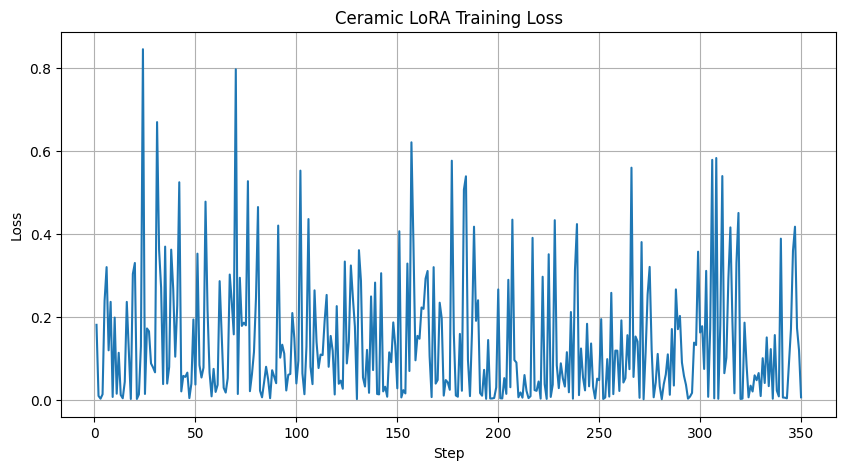

Saved: /content/ceramic_lora_loss.png


In [26]:
# Plot and save loss
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(df_loss["step"], df_loss["loss"])
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("Ceramic LoRA Training Loss")
plt.grid(True)

LOSS_PLOT_PATH = "/content/ceramic_lora_loss.png"
plt.savefig(LOSS_PLOT_PATH, dpi=200, bbox_inches="tight")
plt.show()

print("Saved:", LOSS_PLOT_PATH)

In [27]:
#  Save LoRA + logs + plot to Drive
!mkdir -p "{DRIVE_OUTPUT}"
!mkdir -p "{DRIVE_LOGS}"

!cp -r "{KOHYA_OUTPUT}"/* "{DRIVE_OUTPUT}/"
!cp -r "{LOG_DIR}"/* "{DRIVE_LOGS}/"
!cp "{LOSS_PLOT_PATH}" "{DRIVE_LOGS}/ceramic_lora_loss.png"

print("Saved LoRA to:", DRIVE_OUTPUT)
print("Saved logs to:", DRIVE_LOGS)

Saved LoRA to: /content/drive/MyDrive/ceramic_LoRa/kohya_output
Saved logs to: /content/drive/MyDrive/ceramic_LoRa/kohya_logs


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/30 [00:00<?, ?it/s]

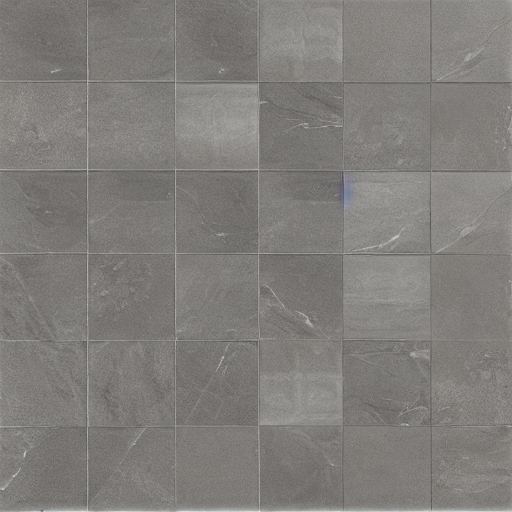

In [28]:
#Test LoRA
import torch
from diffusers import StableDiffusionPipeline

LORA_PATH = f"{KOHYA_OUTPUT}/ceramic_lora.safetensors"

pipe = StableDiffusionPipeline.from_single_file(
    BASE_MODEL,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

pipe.load_lora_weights(LORA_PATH)

prompt = (
    "ceramic floor material, light gray ceramic tiles, marble pattern, "
    "matte finish, realistic interior floor texture, high quality"
)

image = pipe(
    prompt=prompt,
    num_inference_steps=30,
    guidance_scale=7.5
).images[0]

TEST_OUTPUT = "/content/test_ceramic_lora.png"
image.save(TEST_OUTPUT)
image

# ***test***

In [1]:
!pip install gdown
!gdown https://huggingface.co/runwayml/stable-diffusion-v1-5/resolve/main/v1-5-pruned-emaonly.safetensors \
    -O /content/drive/MyDrive/ceramic_LoRa/models/v1-5-pruned-emaonly.safetensors

Error:

	[Errno 2] No such file or directory:
	'/content/drive/MyDrive/ceramic_LoRa/models'

To report issues, please visit https://github.com/wkentaro/gdown/issues.


In [3]:
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

  Preparing metadata (setup.py) ... done


In [24]:
#Download SAM
import os

SAM_DIR = "/content/drive/MyDrive/ceramic_LoRa/models/sam"
os.makedirs(SAM_DIR, exist_ok=True)

SAM_PATH = f"{SAM_DIR}/sam_vit_l_0b3195.pth"

if not os.path.exists(SAM_PATH):
    !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth -O $SAM_PATH

print("SAM_PATH:", SAM_PATH)
print("exists:", os.path.exists(SAM_PATH))

SAM_PATH: /content/drive/MyDrive/ceramic_LoRa/models/sam/sam_vit_l_0b3195.pth
exists: True


In [18]:
IMAGE_PATH = "/content/drive/MyDrive/test/fb6eb4c9a0adad224faa7fb18e3dfcaa.jpg"
SEGFORMER_PATH = "/content/drive/MyDrive/segformer_room_struct/final"

BASE_MODEL = "/content/drive/MyDrive/ceramic_LoRa/models/v1-5-pruned-emaonly.safetensors"

CONTROLNET_PATH = "lllyasviel/control_v11f1p_sd15_depth"

LORA_PATH = "/content/drive/MyDrive/ceramic_LoRa/kohya_output/ceramic_lora.safetensors"

Loading weights:   0%|          | 0/380 [00:00<?, ?it/s]

Unique class ids: [0 1 2]


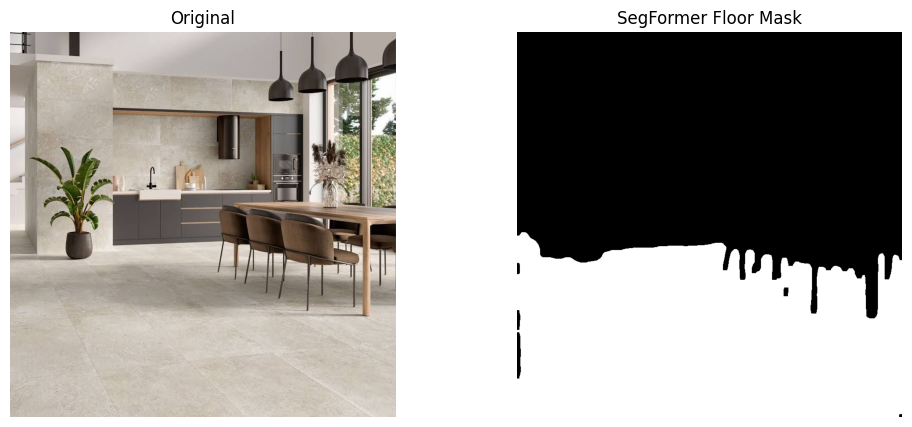

Saved: /content/segformer_floor_mask.png


In [19]:
# SegFormer floor mask
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch.nn.functional as F
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)

processor = SegformerImageProcessor.from_pretrained(SEGFORMER_PATH)
seg_model = SegformerForSemanticSegmentation.from_pretrained(SEGFORMER_PATH).to(DEVICE)
seg_model.eval()

inputs = processor(images=image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    outputs = seg_model(**inputs)

logits = outputs.logits

upsampled_logits = F.interpolate(
    logits,
    size=image.size[::-1],
    mode="bilinear",
    align_corners=False
)

pred = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

print("Unique class ids:", np.unique(pred))

# عدّلي إذا الأرضية عندك ID مختلف
FLOOR_ID = 2

floor_mask = (pred == FLOOR_ID).astype(np.uint8) * 255

kernel = np.ones((5, 5), np.uint8)
floor_mask = cv2.morphologyEx(floor_mask, cv2.MORPH_OPEN, kernel, iterations=1)
floor_mask = cv2.morphologyEx(floor_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

SEG_MASK_PATH = "/content/segformer_floor_mask.png"
Image.fromarray(floor_mask).save(SEG_MASK_PATH)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(image_np)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(floor_mask, cmap="gray")
plt.title("SegFormer Floor Mask")
plt.axis("off")
plt.show()

print("Saved:", SEG_MASK_PATH)

In [21]:
print("IMAGE_PATH:", IMAGE_PATH)
print("Exists:", os.path.exists(IMAGE_PATH))

image = Image.open(IMAGE_PATH).convert("RGB")
image_np = np.array(image)

print("image_np shape:", image_np.shape)

IMAGE_PATH: /content/drive/MyDrive/test/fb6eb4c9a0adad224faa7fb18e3dfcaa.jpg
Exists: True
image_np shape: (800, 800, 3)


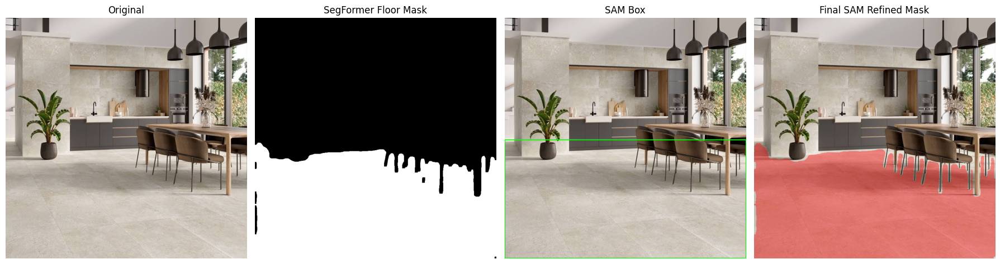

Saved: /content/final_inpaint_mask.png
SAM scores: [1.0039688  0.98072195 1.0083199 ]
Best index: 2


In [25]:
# Refine SegFormer floor mask using SAM box
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from segment_anything import sam_model_registry, SamPredictor

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

floor_mask = (floor_mask > 127).astype(np.uint8) * 255

contours, _ = cv2.findContours(
    floor_mask,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)

if len(contours) == 0:
    raise ValueError("No contours found in floor mask..")

largest_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_contour)

pad = 10
x1 = max(0, x - pad)
y1 = max(0, y - pad)
x2 = min(image_np.shape[1] - 1, x + w + pad)
y2 = min(image_np.shape[0] - 1, y + h + pad)

input_box = np.array([x1, y1, x2, y2])

sam = sam_model_registry["vit_l"](checkpoint=SAM_PATH)
sam.to(device=DEVICE)
sam.eval()

predictor = SamPredictor(sam)
predictor.set_image(image_np)

masks, scores, logits = predictor.predict(
    box=input_box,
    multimask_output=True
)

best_idx = int(np.argmax(scores))
sam_mask = masks[best_idx].astype(np.uint8) * 255

# أهم خطوة: لا نخلي SAM يوسع برا الأرضية
final_mask = ((sam_mask > 0) & (floor_mask > 0)).astype(np.uint8) * 255

kernel = np.ones((3, 3), np.uint8)
final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_OPEN, kernel, iterations=1)
final_mask = cv2.morphologyEx(final_mask, cv2.MORPH_CLOSE, kernel, iterations=1)

FINAL_MASK_PATH = "/content/final_inpaint_mask.png"
Image.fromarray(final_mask).save(FINAL_MASK_PATH)

overlay = image_np.copy()
overlay[final_mask > 0] = (
    0.6 * overlay[final_mask > 0] + 0.4 * np.array([255, 0, 0])
).astype(np.uint8)

boxed = image_np.copy()
cv2.rectangle(boxed, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.figure(figsize=(18, 5))

plt.subplot(1, 4, 1)
plt.imshow(image_np)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(floor_mask, cmap="gray")
plt.title("SegFormer Floor Mask")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(boxed)
plt.title("SAM Box")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(overlay)
plt.title("Final SAM Refined Mask")
plt.axis("off")

plt.tight_layout()
plt.show()

print("Saved:", FINAL_MASK_PATH)
print("SAM scores:", scores)
print("Best index:", best_idx)

In [26]:
!pip install -q controlnet_aux

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.4/290.4 kB 6.2 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.12/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segmen

dpt_hybrid-midas-501f0c75.pt:   0%|          | 0.00/493M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


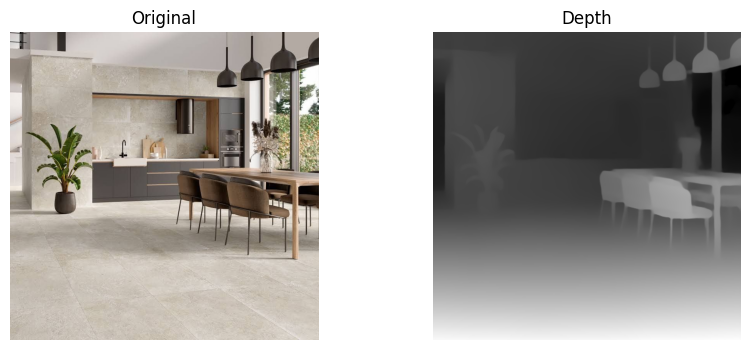

Saved: /content/depth_control.png


In [27]:
from controlnet_aux import MidasDetector
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

image = Image.open(IMAGE_PATH).convert("RGB")

midas = MidasDetector.from_pretrained("lllyasviel/Annotators")
depth_img = midas(image).resize(image.size)

DEPTH_PATH = "/content/depth_control.png"
depth_img.save(DEPTH_PATH)

plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title("Original")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(depth_img)
plt.title("Depth")
plt.axis("off")
plt.show()

print("Saved:", DEPTH_PATH)

In [28]:
!pip install -q diffusers transformers accelerate safetensors xformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 30.2 MB/s eta 0:00:00


In [29]:
import torch
from diffusers import ControlNetModel, StableDiffusionControlNetInpaintPipeline, UniPCMultistepScheduler
from PIL import Image

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
DTYPE = torch.float16 if DEVICE == "cuda" else torch.float32

mask_img = Image.open(FINAL_MASK_PATH).convert("L").resize(image.size, Image.NEAREST)
depth_img = Image.open(DEPTH_PATH).convert("RGB").resize(image.size)

controlnet = ControlNetModel.from_pretrained(
    CONTROLNET_PATH,
    torch_dtype=DTYPE
)

pipe = StableDiffusionControlNetInpaintPipeline.from_single_file(
    BASE_MODEL,
    controlnet=controlnet,
    torch_dtype=DTYPE,
    safety_checker=None,
    requires_safety_checker=False
).to(DEVICE)

pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

pipe.load_lora_weights(LORA_PATH)

try:
    pipe.enable_xformers_memory_efficient_attention()
except Exception:
    pipe.enable_attention_slicing()

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/945 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

In [37]:
import os, glob, torch, math
import matplotlib.pyplot as plt

CHECKPOINT_DIR = "/content/drive/MyDrive/ceramic_LoRa/kohya_output"

checkpoint_paths = sorted([
    p for p in glob.glob(CHECKPOINT_DIR + "/*.safetensors")
    if "debug" not in os.path.basename(p)
])

print("Will test:")
for p in checkpoint_paths:
    print(os.path.basename(p))

results = []

PROMPT = (
   "glossy polished ceramic tile floor, light gray marble ceramic tiles, "
    "clear grout lines, reflective surface, subtle floor reflections, "
    "luxury interior floor, realistic lighting, natural shadows under furniture, "
    "replace floor material completely, preserve furniture and walls"
)

NEGATIVE_PROMPT = (
   "matte floor, dull floor, carpet, rug, wood floor, changed furniture, changed walls, "
    "distorted chairs, floating furniture, warped tiles, bad perspective, blurry, artifacts"
)

for lora_path in checkpoint_paths:
    ckpt_name = os.path.basename(lora_path)
    print("Running:", ckpt_name)

    try:
        pipe.unload_lora_weights()
    except Exception:
        pass

    pipe.load_lora_weights(
        pretrained_model_name_or_path_or_dict=os.path.dirname(lora_path),
        weight_name=os.path.basename(lora_path),
    )

    generator = torch.Generator(device=DEVICE).manual_seed(42)

    result = pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        image=image,
        mask_image=mask_img,
        control_image=depth_img,
        num_inference_steps=35,
        guidance_scale=9,
        controlnet_conditioning_scale=0.6,
        strength=0.85,
        generator=generator
    ).images[0]

    results.append((ckpt_name, result))
    result.save(f"/content/result_{ckpt_name}.png")

print("Generated:", len(results))

Will test:
ceramic_lora-step00000200.safetensors
ceramic_lora-step00000400.safetensors
ceramic_lora-step00000600.safetensors
ceramic_lora-step00000800.safetensors
ceramic_lora.safetensors
Running: ceramic_lora-step00000200.safetensors


Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Running: ceramic_lora-step00000400.safetensors


Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Running: ceramic_lora-step00000600.safetensors


Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Running: ceramic_lora-step00000800.safetensors


Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Running: ceramic_lora.safetensors


Loading weights:   0%|          | 0/144 [00:00<?, ?it/s]

  0%|          | 0/29 [00:00<?, ?it/s]

Generated: 5


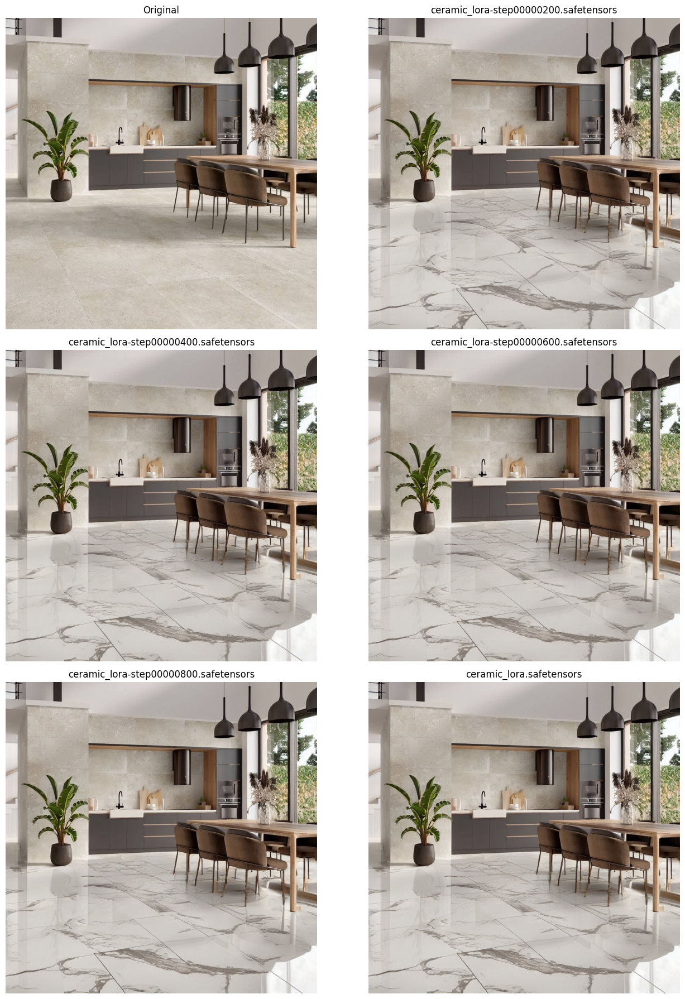

In [39]:
display_items = [("Original", image)] + results

cols = 2
rows = math.ceil(len(display_items) / cols)

plt.figure(figsize=(14, 6 * rows))

for i, (title, img) in enumerate(display_items, 1):
    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()